In [1]:
import jax
from jax.config import config
config.update("jax_enable_x64", True)

In [2]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import moscot
from moscot.problems.time import TemporalProblem
import moscot.plotting as mpl

In [3]:
adata = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/pancreas_multiome_2022_multiVI_embedding.h5ad")

In [4]:
endocrine_celltypes = [
    "Ductal",
    "Prlf. Ductal",
    "Ngn3 low",
    "Ngn3 high",
    "Ngn3 high cycling",
    "Fev+",
    "Fev+ Alpha",
    "Fev+ Beta",
    "Fev+ Delta",
    "Eps/Delta progenitors",
    "Alpha",
    "Beta",
    "Delta",
    "Epsilon"
]

In [5]:
adata_red = adata[adata.obs["celltype"].isin(endocrine_celltypes)]

In [6]:
adata_removed = adata[~adata.obs["celltype"].isin(endocrine_celltypes)]

In [7]:
adata_removed.obs["celltype"].cat.categories

Index(['Imm. Acinar', 'Mat. Acinar'], dtype='object')

In [8]:
adata_red.obs["celltype"].cat.categories

Index(['Alpha', 'Beta', 'Delta', 'Ductal', 'Eps/Delta progenitors', 'Epsilon',
       'Fev+', 'Fev+ Alpha', 'Fev+ Beta', 'Fev+ Delta', 'Ngn3 high',
       'Ngn3 high cycling', 'Ngn3 low', 'Prlf. Ductal'],
      dtype='object')

In [9]:
adata = adata_red.copy()

In [10]:
adata.obs['time'] = adata.obs.apply(lambda x: 14.5 if x["sample"]=="E14.5" else 15.5, axis=1)

In [11]:
sc.tl.umap(adata)

/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


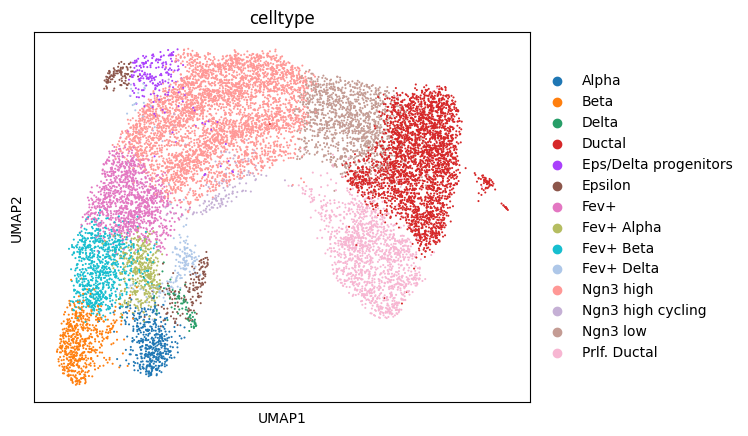

In [12]:
sc.pl.umap(adata, color="celltype")

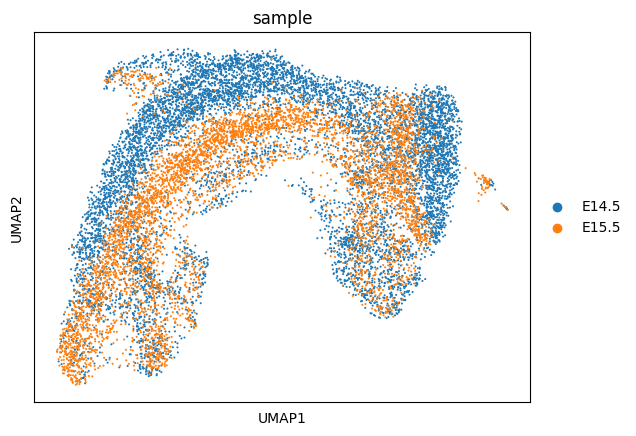

In [13]:
sc.pl.umap(adata, color="sample")

In [14]:
sc.tl.leiden(adata, restrict_to=("celltype", ["Eps/Delta progenitors"]), resolution=0.3, key_added="tmp_1")


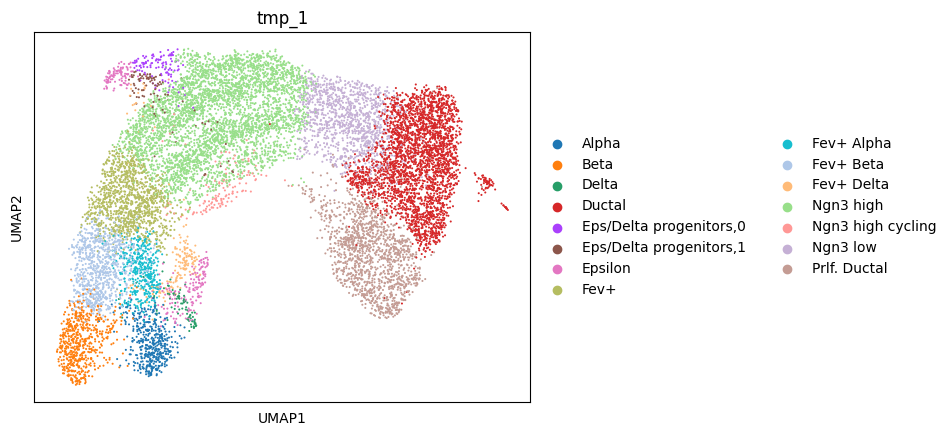

In [15]:
sc.pl.umap(adata, color="tmp_1")

In [16]:
sc.tl.leiden(adata, restrict_to=("tmp_1", ["Ngn3 high"]), resolution=0.5, key_added="tmp_2")


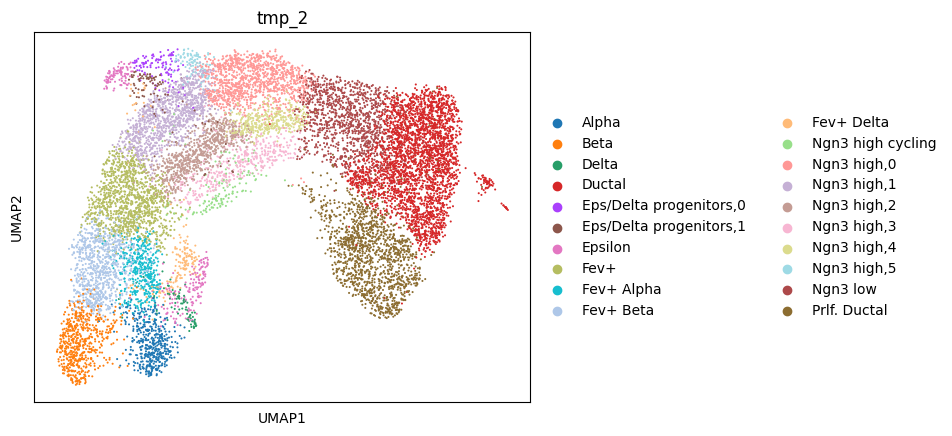

In [17]:
sc.pl.umap(adata, color="tmp_2")

In [18]:
adata.obs["celltype_refined"] = adata.obs["tmp_2"]

In [19]:
x,y = 'sample', 'celltype_refined'
df = adata.obs.copy()
df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

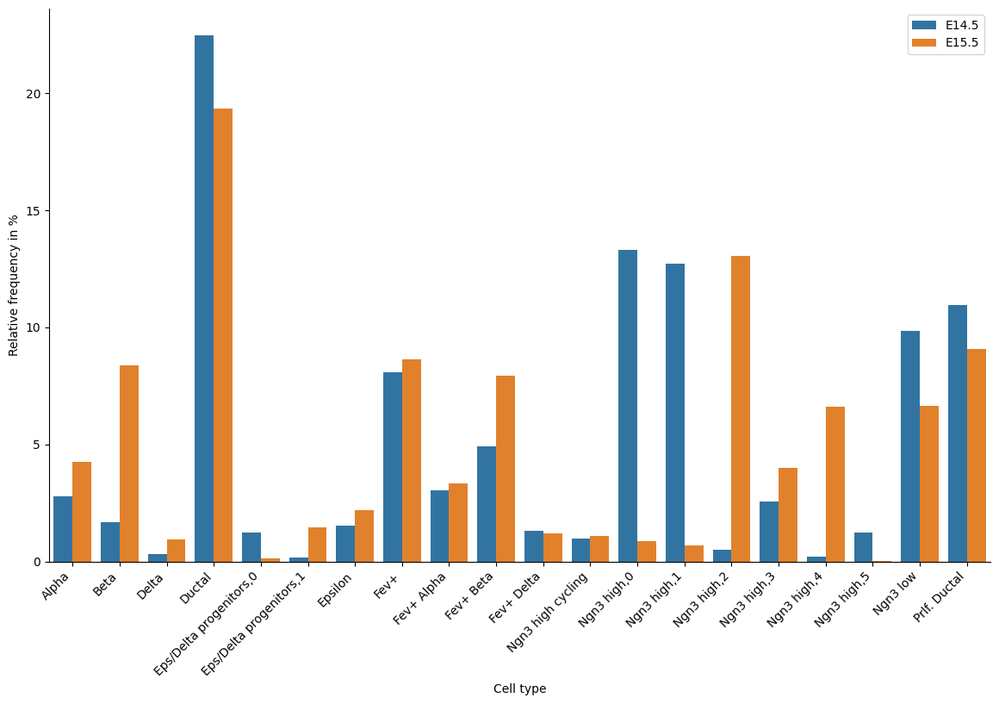

In [20]:
import seaborn as sns

g = sns.catplot(x="level_1",y='percent',hue=x,kind='bar',data=df1, legend=False,height=8.27, aspect=11.7/8.27)
plt.xlabel("Cell type")
plt.ylabel("Relative frequency in %")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()


# MultiVI space

In [21]:
tp0 = TemporalProblem(adata)
#tp0 = tp0.score_genes_for_marginals(gene_set_proliferation="mouse", gene_set_apoptosis="mouse")
tp0 = tp0.prepare("time", joint_attr="X_multi_vi")

In [22]:
tp0 = tp0.solve(epsilon=1e-2, scale_cost="mean")

In [23]:
ct_desc = tp0.cell_transition(start=14.5, end=15.5, early_annotation="celltype_refined", late_annotation="celltype_refined", forward=True)

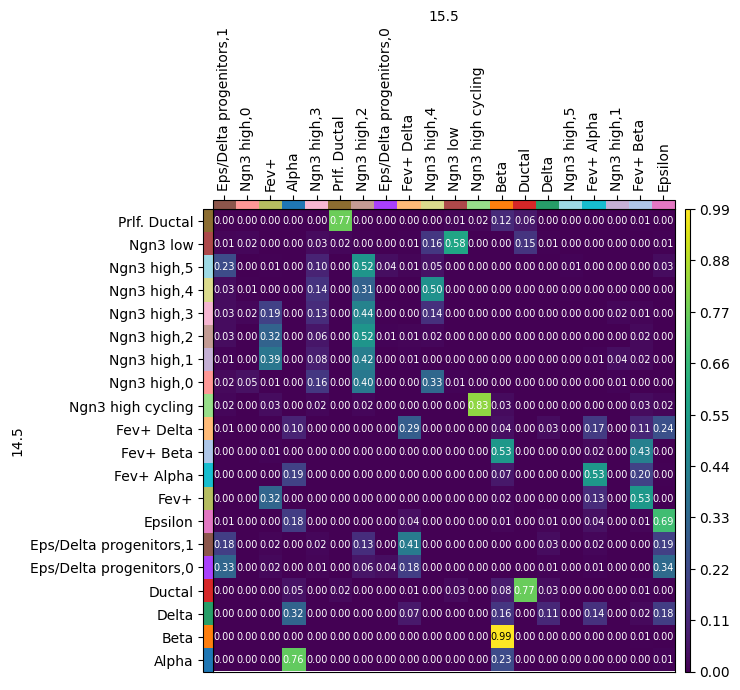

In [24]:
mpl.cell_transition(tp0, dpi=100, fontsize=7)

In [25]:
ct_desc = tp0.cell_transition(start=14.5, end=15.5, early_annotation="celltype_refined", late_annotation="celltype_refined", forward=False)

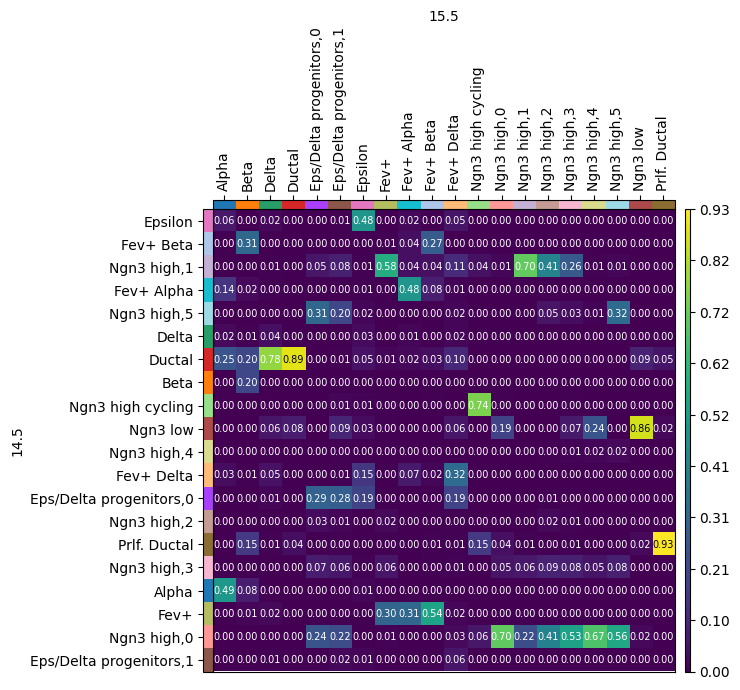

In [26]:
mpl.cell_transition(tp0, dpi=100, fontsize=7)

In [27]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Eps/Delta progenitors,0")

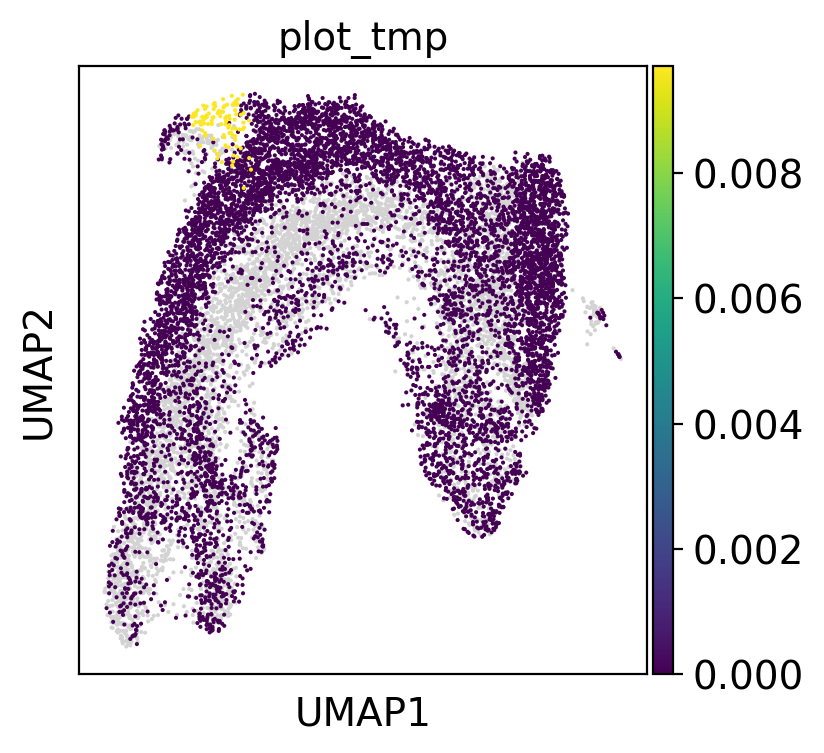

In [28]:
mpl.push(tp0, time_points=[14.5])

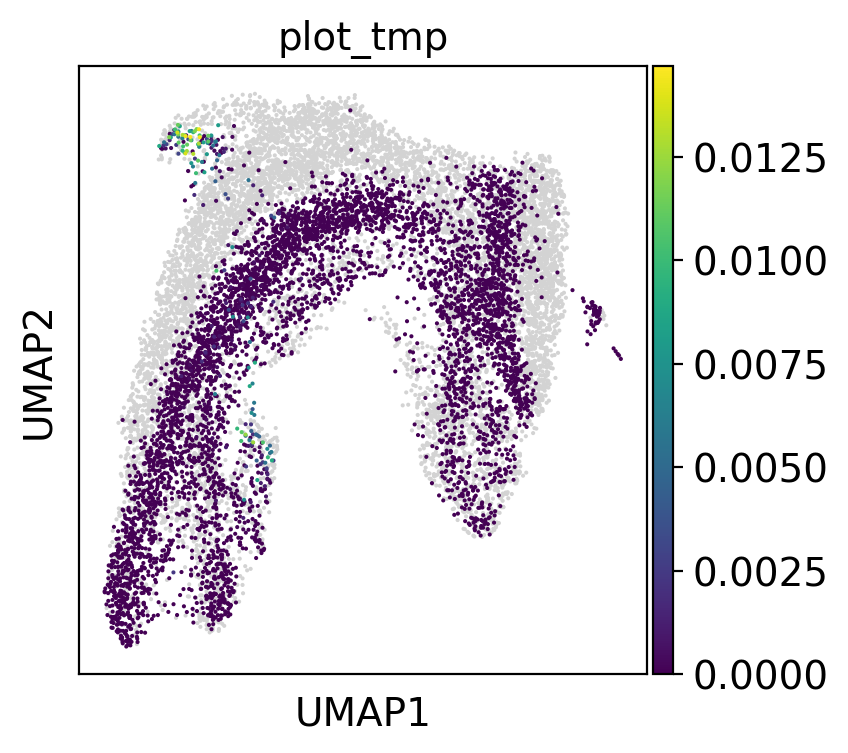

In [29]:
mpl.push(tp0, time_points=[15.5])

In [30]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Eps/Delta progenitors,1")

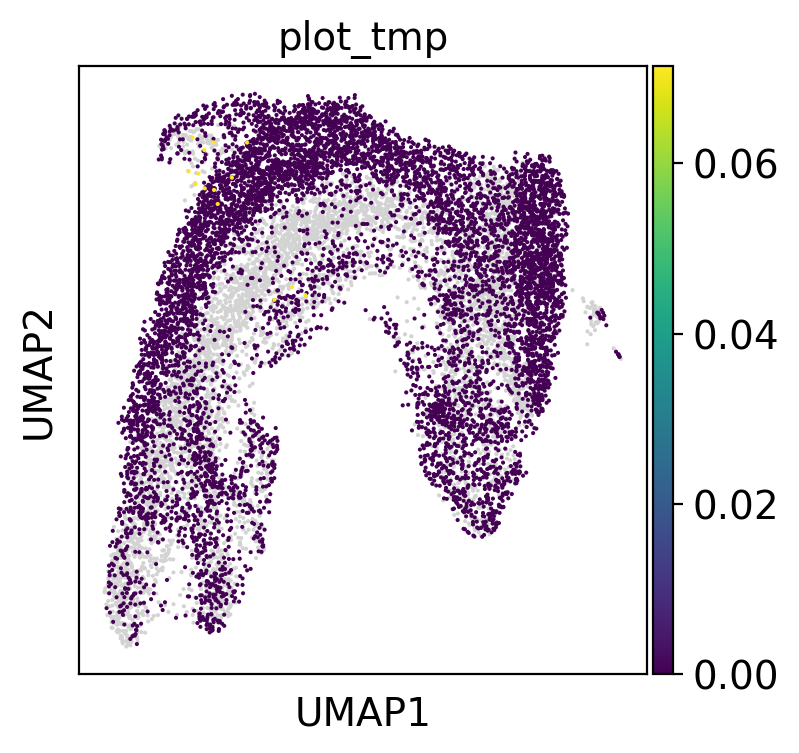

In [31]:
mpl.push(tp0, time_points=[14.5])

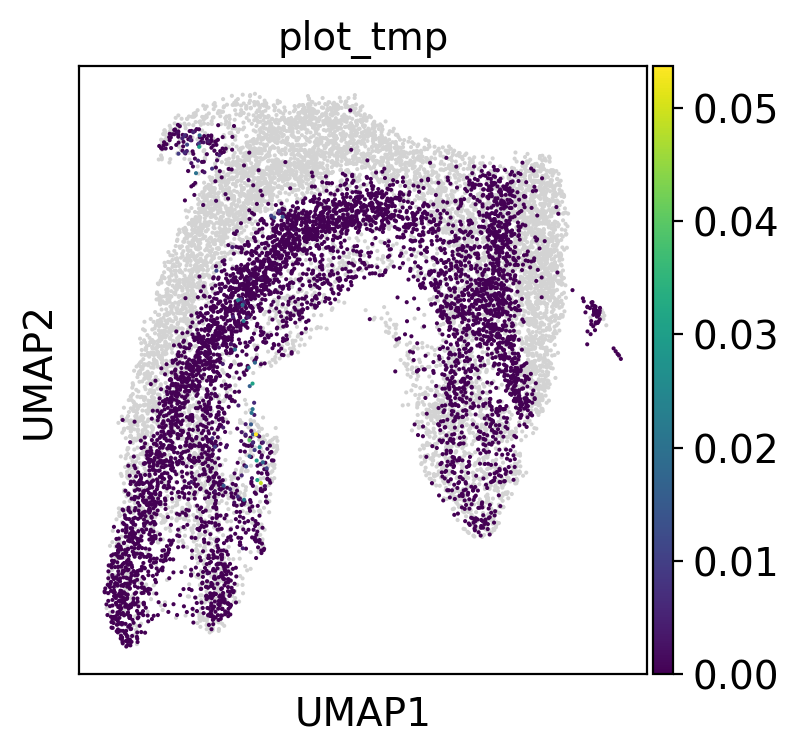

In [32]:
mpl.push(tp0, time_points=[15.5])

In [33]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Epsilon")

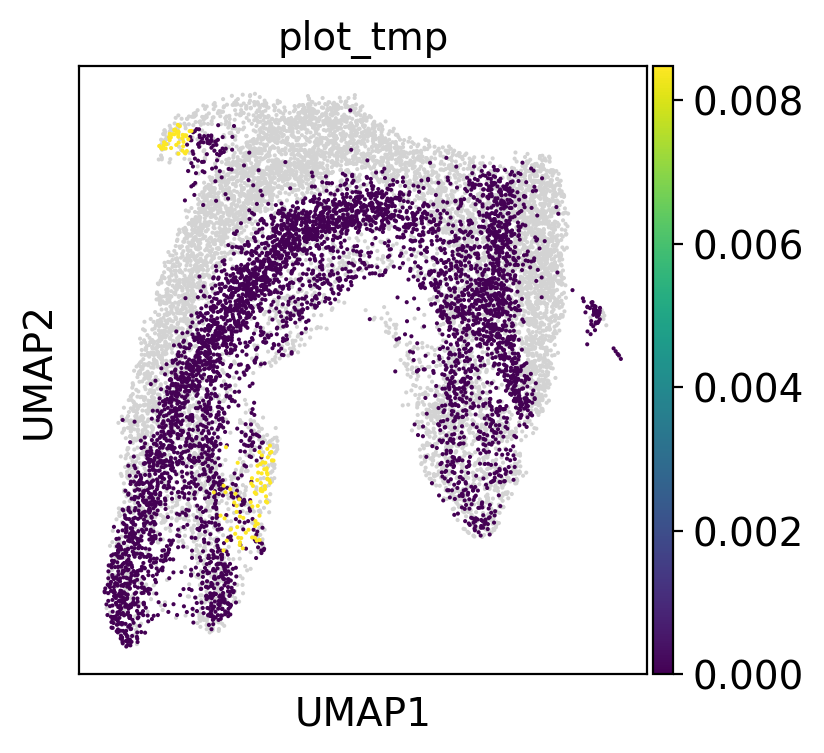

In [34]:
mpl.pull(tp0, time_points=[15.5])

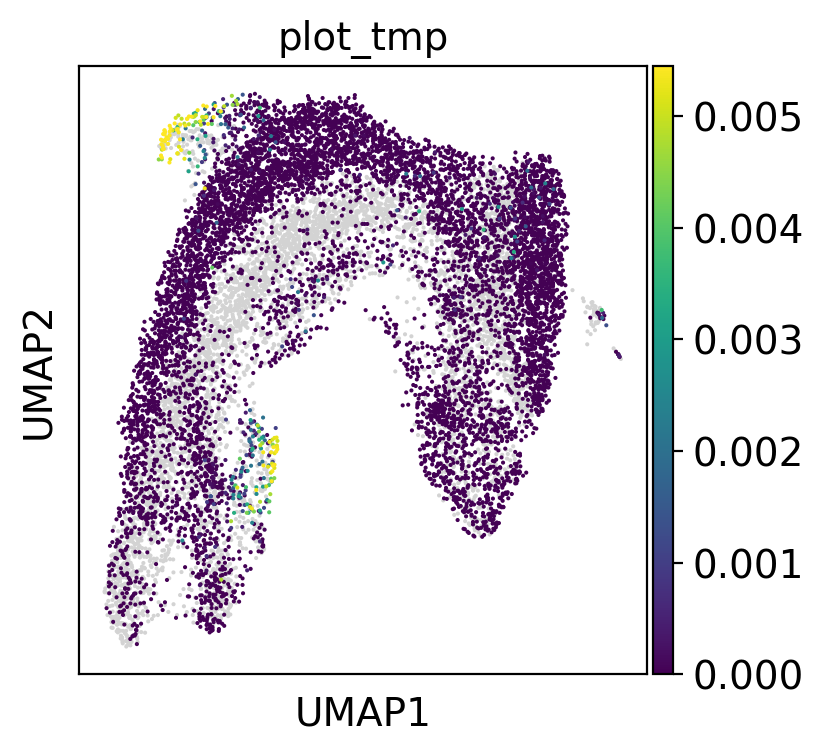

In [35]:
mpl.pull(tp0, time_points=[14.5])

In [36]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Delta")

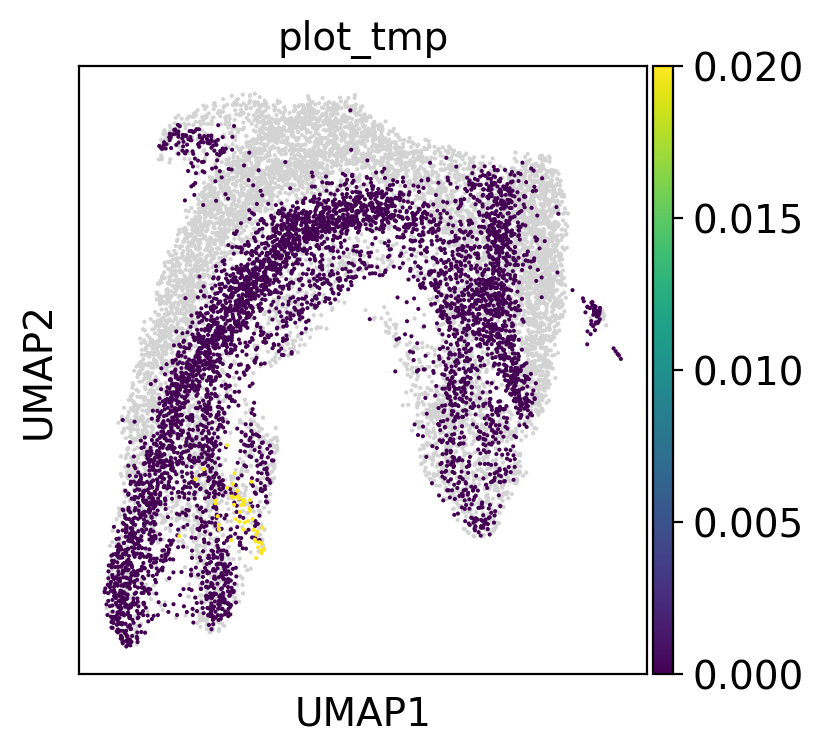

In [37]:
mpl.pull(tp0, time_points=[15.5])

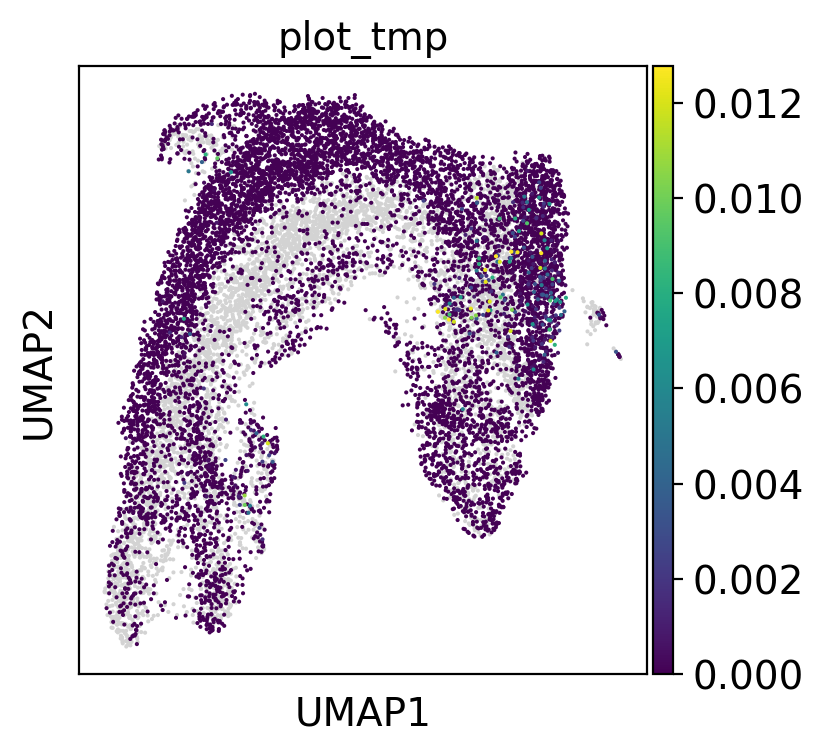

In [38]:
mpl.pull(tp0, time_points=[14.5])

In [39]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

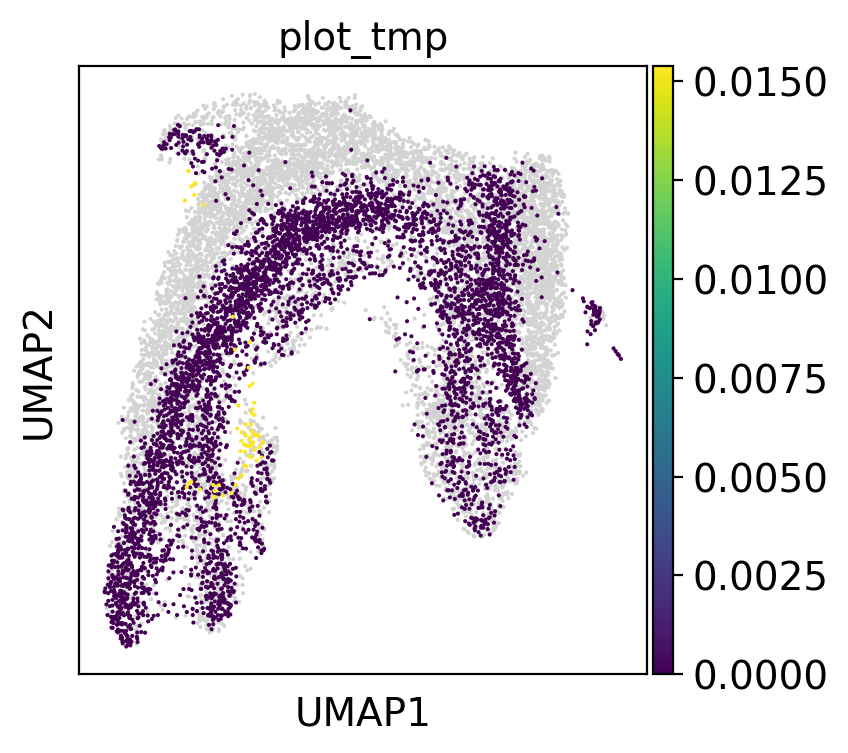

In [40]:
mpl.pull(tp0, time_points=[15.5])

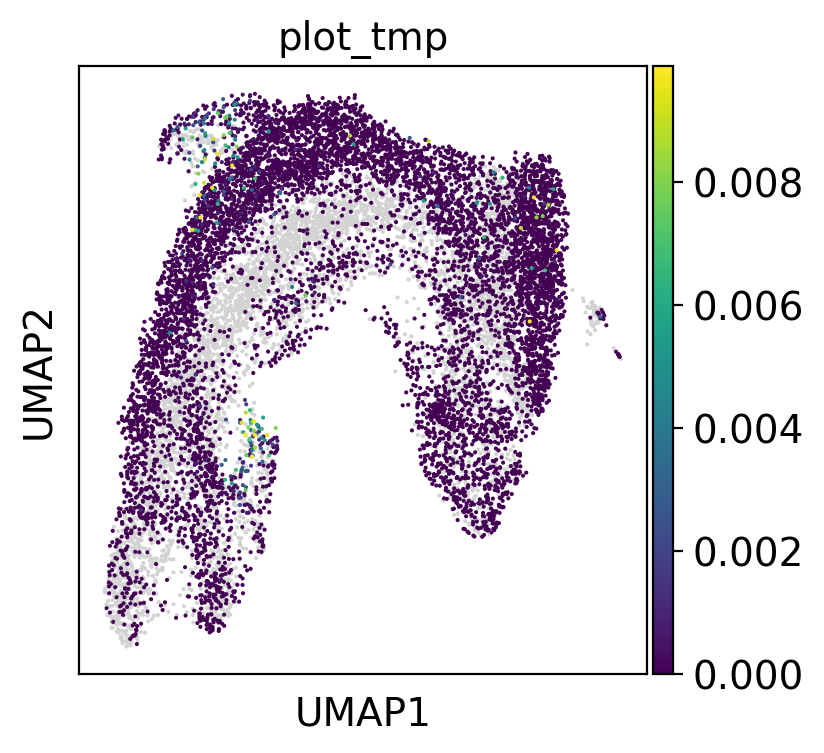

In [41]:
mpl.pull(tp0, time_points=[14.5])

In [42]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

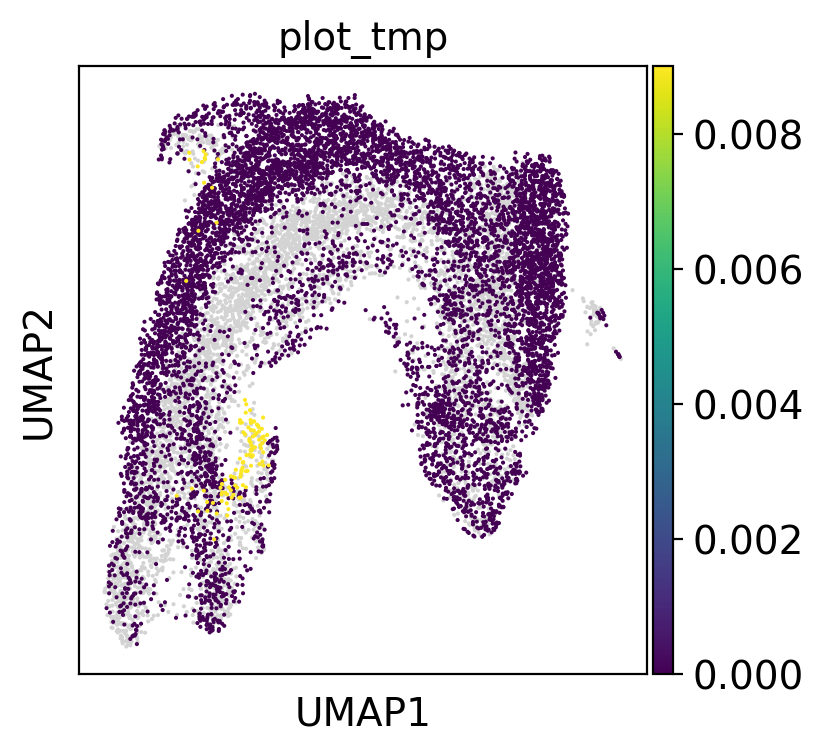

In [43]:
mpl.push(tp0, time_points=[14.5])

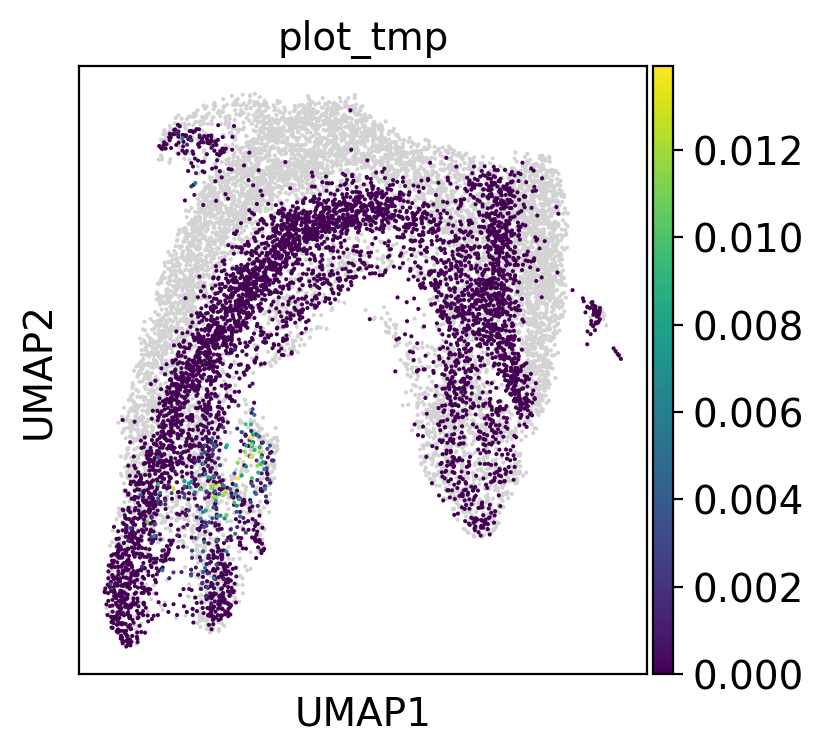

In [44]:
mpl.push(tp0, time_points=[15.5])

In [45]:
sc.tl.leiden(adata, restrict_to=("celltype_refined", ["Fev+ Delta"]), resolution=0.5, key_added="tmp_3")

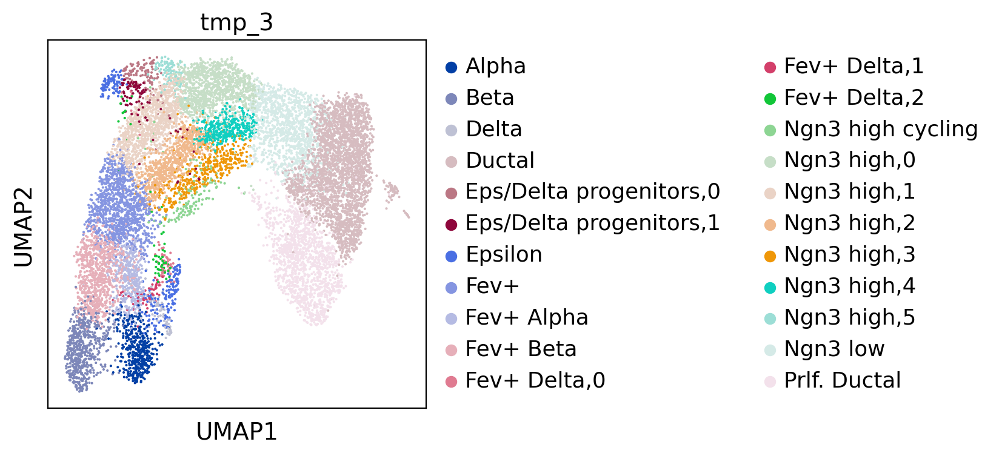

In [46]:
sc.pl.umap(adata, color="tmp_3")

In [47]:
tp1 = TemporalProblem(adata)
tp1 = tp0.prepare("time", joint_attr="X_multi_vi")
tp1 = tp0.solve(epsilon=1e-2, scale_cost="mean")

In [48]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=True)

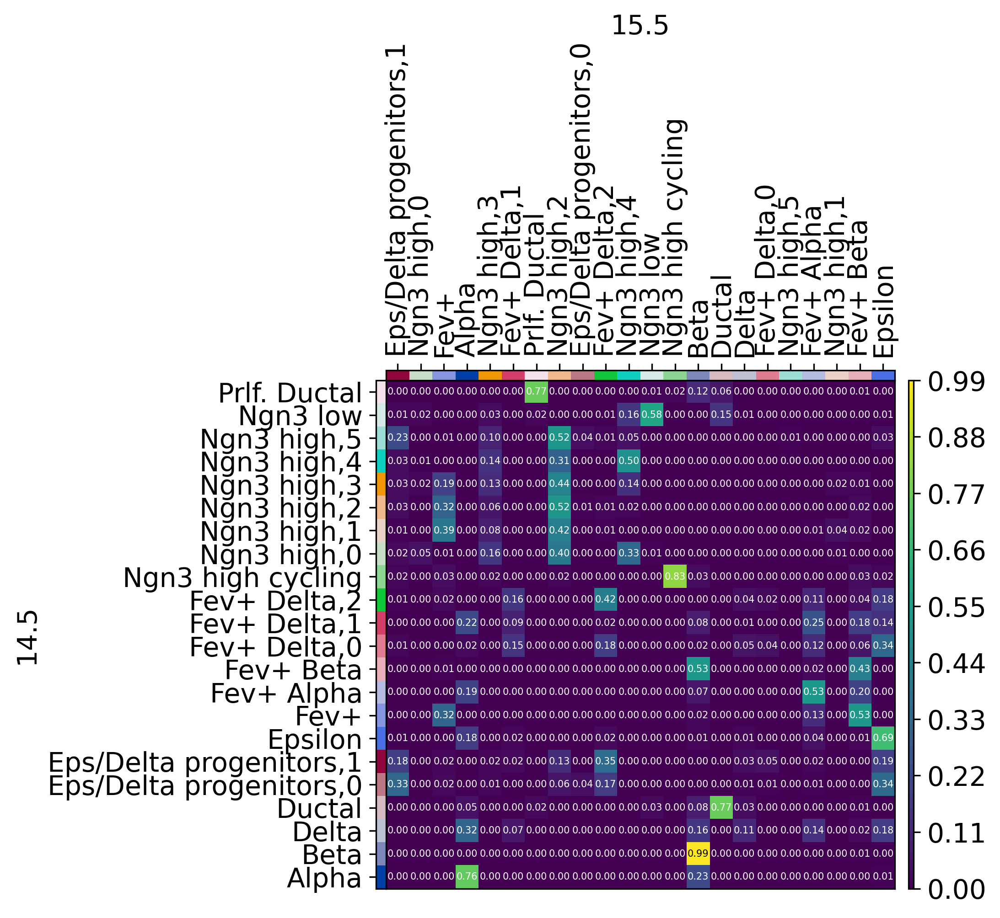

In [49]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [50]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=False)

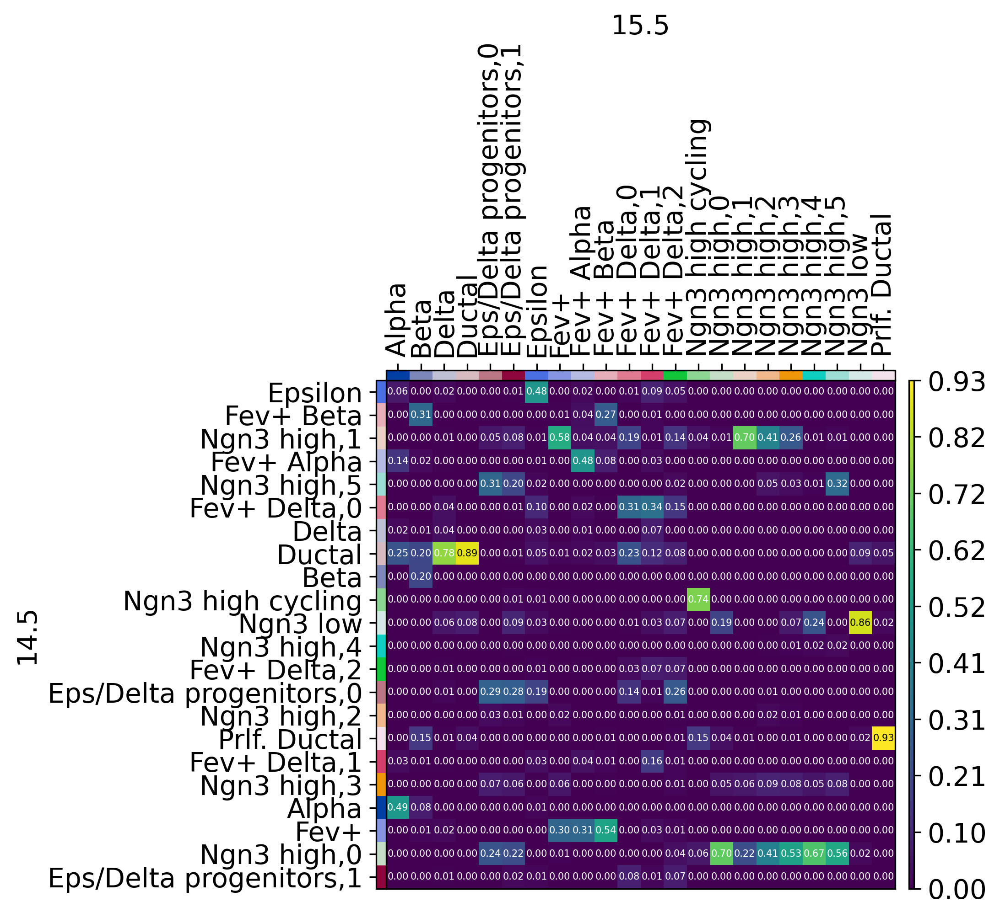

In [51]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [52]:
ct_to_keep = ["Fev+ Delta,0", "Fev+ Delta,1", "Fev+ Delta,2", "Eps/Delta progenitors,0", "Eps/Delta progenitors,1", "Epsilon", "Delta"]
adata_reduced_2 = adata[adata.obs["tmp_3"].isin(ct_to_keep)]

In [53]:
adata_reduced_2 = adata_reduced_2[:, adata_reduced_2.var["feature_type"]=="Gene Expression"]

In [54]:
genes_to_consider = ["Fev", "Hhex", "Gcg", "Sst", "Ghrl", "Pyy", "Ppy"]

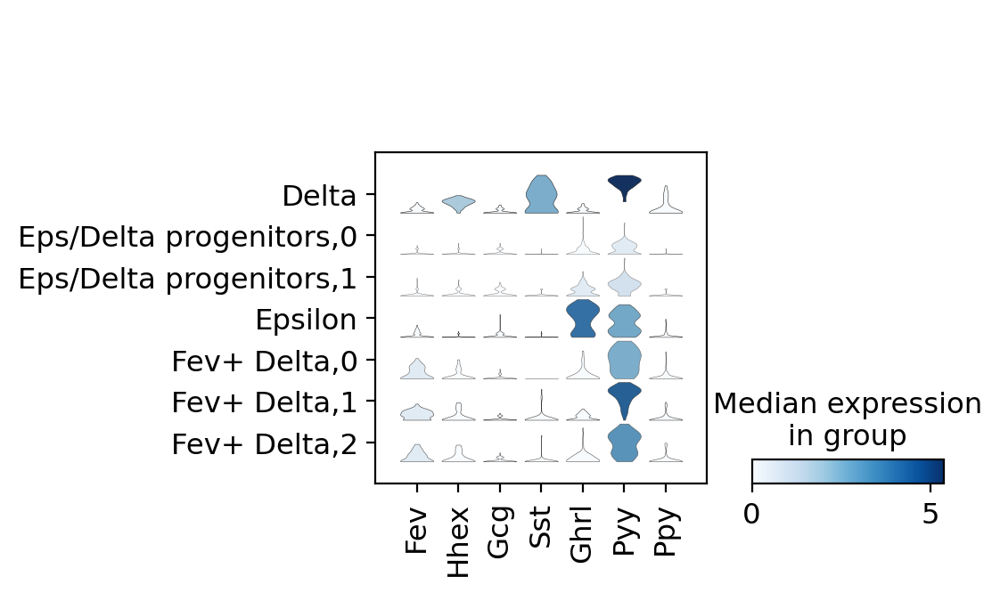

In [55]:
sc.pl.stacked_violin(adata_reduced_2, var_names=genes_to_consider, groupby="tmp_3")

In [56]:
fev_plus_eps = ['Tmem184c', 'Psmc2', 'Spint1', 'Ubl3', 'Sdcbp', 'Pclo', 'Lpcat3', 'Hpca', 'Cer1', 'Drap1', 'Lrrc42', 'Ppp3ca', 'Abhd15']

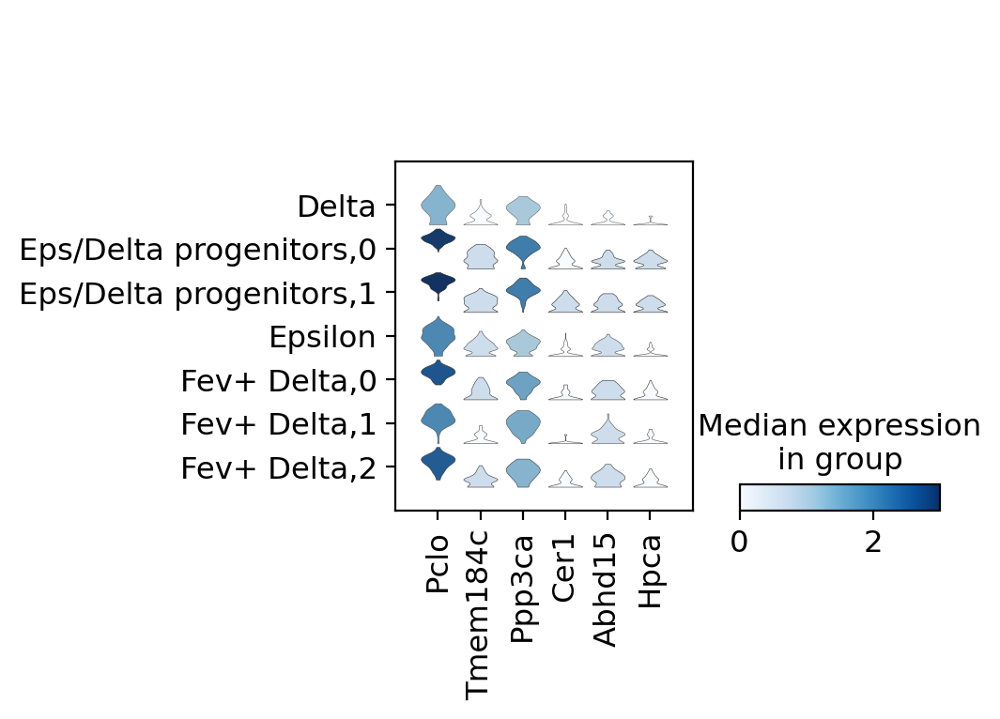

In [57]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(fev_plus_eps))), groupby="tmp_3")

In [58]:
epsilon = ['Maged2', 'Txndc12', 'Prdx5', 'Cd164', 'Gng4', 'Pnmal2', 'Card19', 'Fam174a', 'Gm11837', 'Lrrtm3', 'Sin3b', 'Alcam', 'Ghrl', 'Lamp1', 'Fhl2', 'Anpep', 'Rbpms', 'Atraid', 'Ghrl', 'Maged2', 'Mboat4']

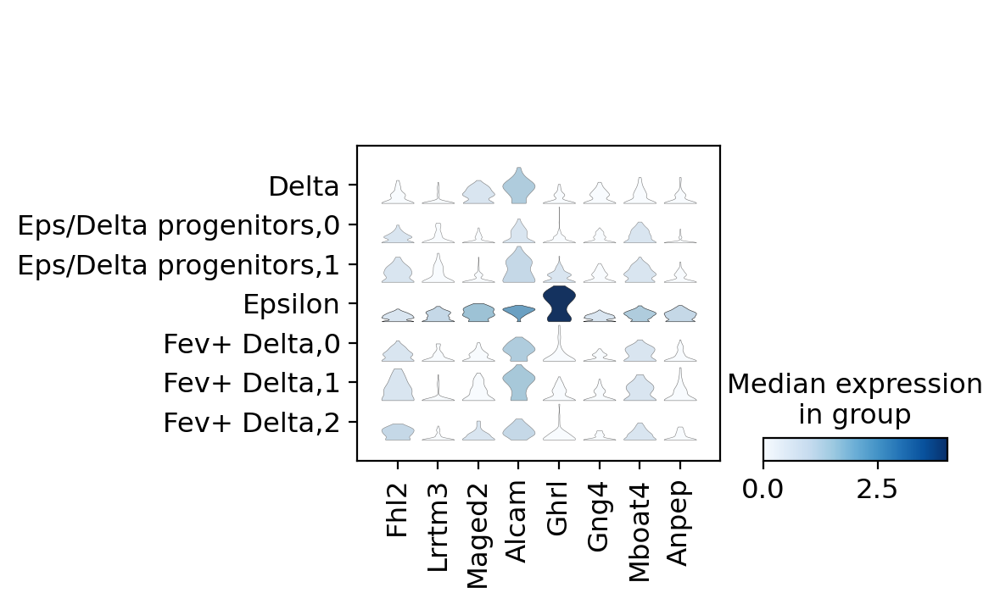

In [59]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(epsilon))), groupby="tmp_3")

In [60]:
delta = ['Cd24a', 'Hhex', 'Pyy', 'Rbp4', 'Sst']

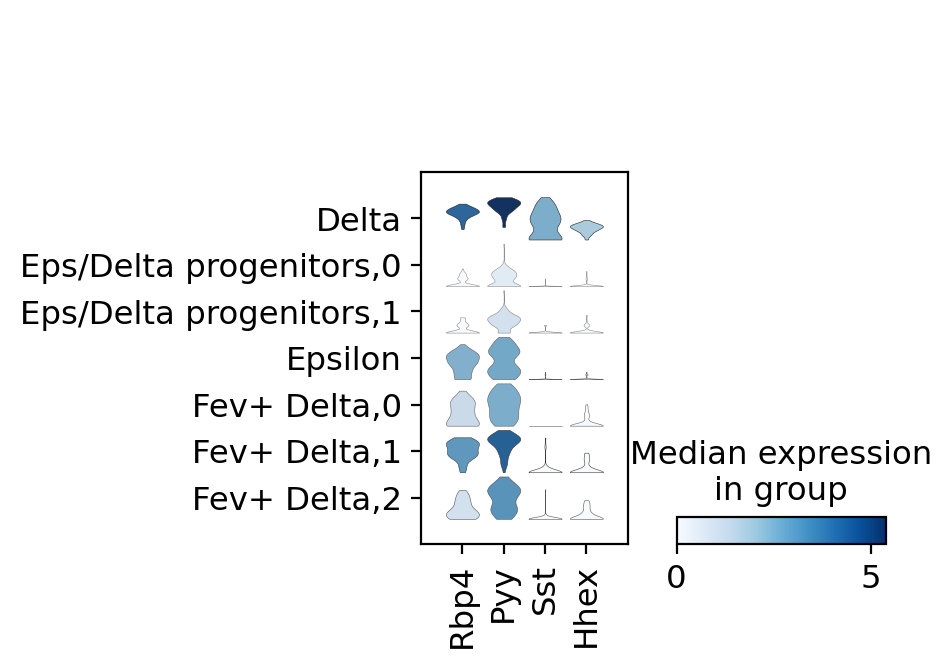

In [61]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(delta))), groupby="tmp_3")

In [62]:
tp1.pull(14.5, 15.5, data="tmp_3", subset="Delta", key_added="delta_pull")

In [63]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull"] > np.percentile(adata.obs["delta_pull"], 98)

In [64]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull_thresholded"].astype(float)

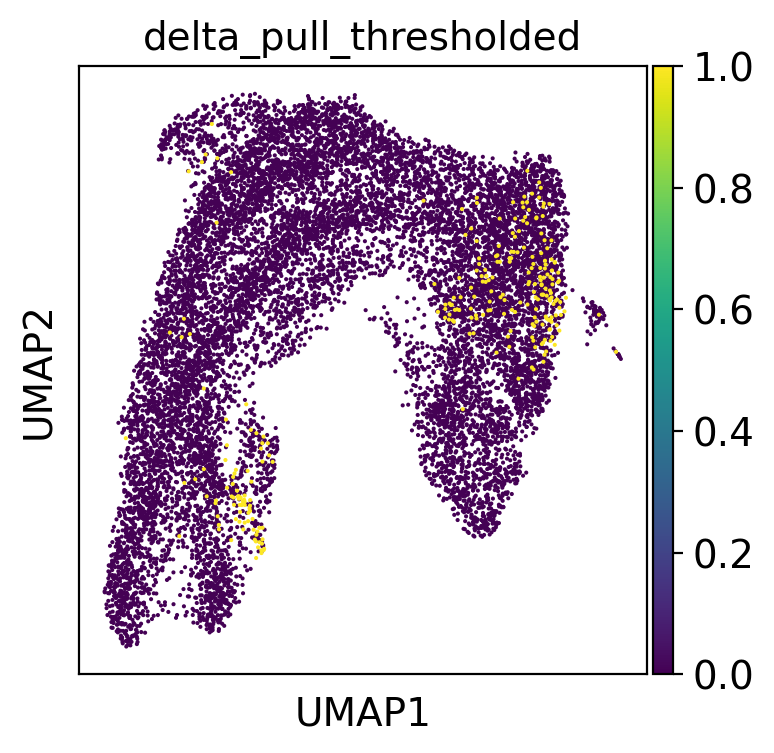

In [65]:
sc.pl.umap(adata, color="delta_pull_thresholded")

In [66]:
def helper2(x):
    if (x["celltype_refined"] == "Ngn3 low") and (x["delta_pull_thresholded"]==1):
        return "ngn3_low_pull"
    if (x["celltype_refined"] in ["Fev+ Delta"]) and (x["delta_pull_thresholded"]==1):
        return "fev_pos_pull"
    return x["celltype_refined"]

In [67]:
adata.obs["tmp_5"] = adata.obs.apply(helper2, axis=1)

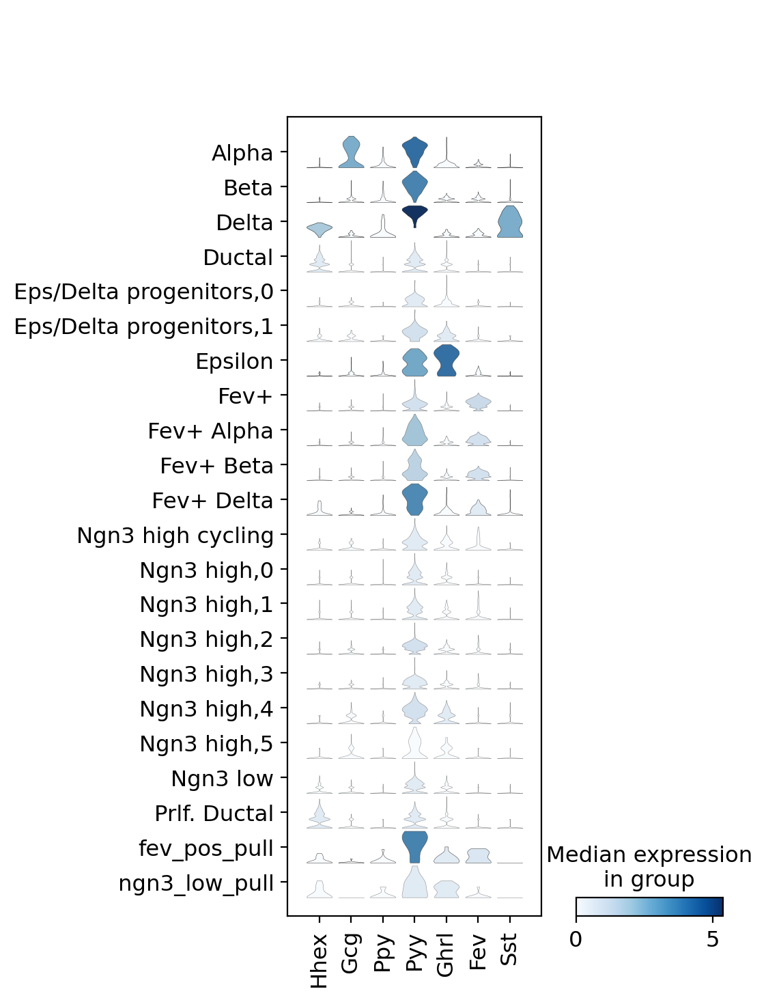

In [68]:
sc.pl.stacked_violin(adata, var_names=list(set(adata.var.index).intersection(set(genes_to_consider))), groupby="tmp_5")


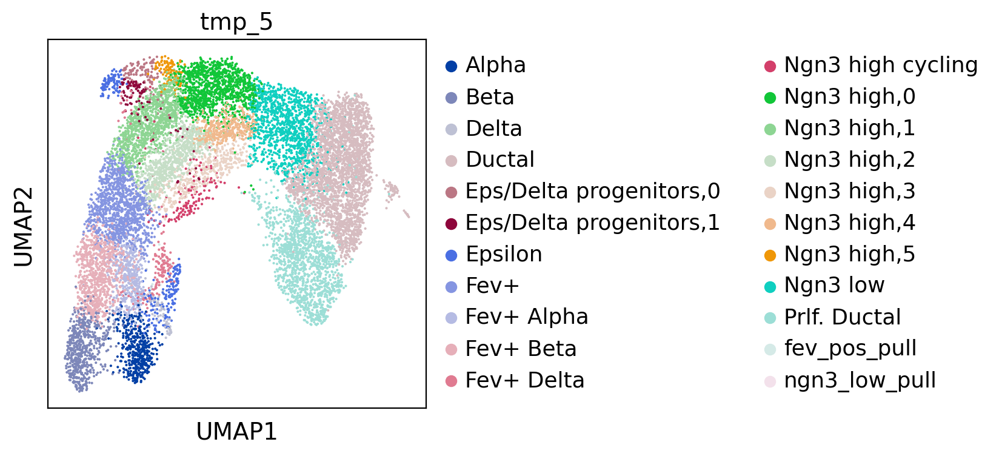

In [69]:
sc.pl.umap(adata, color="tmp_5")

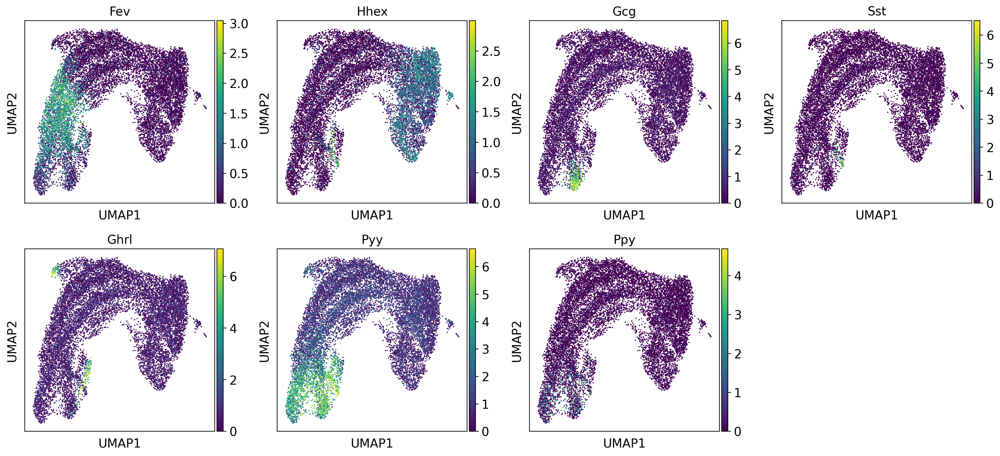

In [70]:
sc.pl.umap(adata, color=genes_to_consider)